##data Processing

In [ ]:
import pandas as pd
# df = pd.read_csv('/content/drive/MyDrive/MLProject/lyrics3.csv')
df = pd.read_csv('/content/drive/MyDrive/MLProject/lyrics-gpt.csv')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df.shape

(1447, 14)

In [ ]:
import ast
df['final_genres'] = df['final_genres'].apply(lambda x: ast.literal_eval(x))
len_df = df['final_genres'].apply(lambda x: len(x))
average_length = len_df.mean()
median_length = len_df.median()
print (average_length)
print (median_length)

1.3517622667588114
1.0


In [ ]:
max_l = len_df.max()
print (max_l)
min_l = len_df.min()
print (min_l)

5
1


In [ ]:
df.dropna(subset=['final_mood'],inplace=True)

In [ ]:
s=set()
for inx,row in df.iterrows():
  # for item in ast.literal_eval(row['final_genres']):
  for item in (row['final_genres']):
    if item not in s:
      s.add(item)
print (s)
print (len(s))

{'folk&country', 'electronic', 'hiphop', 'jazz', 'rhythm&blues', 'rock', 'pop', 'funk&soul'}
8


In [ ]:
import ast
for inx,row in df.iterrows():
  mod = []
  # for item in ast.literal_eval(row['final_genres']):
  for item in (row['final_genres']):
    if item=='latin' or item=='classical':
      continue
    else:
      mod.append(item)
  df.at[inx, 'final_genres'] = mod

In [ ]:
df = df[df['final_genres'].apply(lambda x: len(x) > 0)]
print (df.shape)

(1446, 14)


In [ ]:
df = df[df['final_genres'].apply(lambda x: len(x) > 0)]
print (df.shape)

(1446, 14)


In [ ]:
import numpy as np

df['merged_labels'] = [[] for i in range(1446)]

In [ ]:
for idx,row in df.iterrows():
  x = row['final_genres'].copy()
  x.append(row['final_mood'])
  df.at[idx, 'merged_labels'] = x

In [ ]:
s=dict()
for inx,row in df.iterrows():
  # for item in ast.literal_eval(row['final_genres']):
  for item in (row['final_genres']):
    if item in s:
      s[item]+=1
    else:
      s[item]=1
print (s)


{'electronic': 68, 'rock': 567, 'funk&soul': 152, 'pop': 313, 'folk&country': 413, 'hiphop': 334, 'rhythm&blues': 50, 'jazz': 49}


In [ ]:
s=dict()
for inx,row in df.iterrows():
  # for item in ast.literal_eval(row['final_genres']):
  for item in (row['merged_labels']):
    if item in s:
      s[item]+=1
    else:
      s[item]=1
print (s)

{'electronic': 68, 'rock': 567, 'happy/celebration/party/dance': 403, 'loss/sad/heartbreak/angst/protest': 542, 'funk&soul': 152, 'romantic/love/passion/devotion': 305, 'motivating/inspirational/uplifting/confidence/nostalgia': 196, 'pop': 313, 'folk&country': 413, 'hiphop': 334, 'rhythm&blues': 50, 'jazz': 49}


In [ ]:
mp = {
    'electronic': 3,
    'funk&soul': 2,
    'rhythm&blues': 3,
    'jazz': 3,
    'motivating/inspirational/uplifting/confidence/nostalgia': 2
}

In [ ]:
new_df = pd.DataFrame(columns=df.columns)
unmodified_df = pd.DataFrame(columns=df.columns)
double_df = pd.DataFrame(columns=df.columns)

for idx, row in df.iterrows():
    max_value = float('-inf')

    if "electronic" in row['merged_labels'] or 'rhythm&blues' in row['merged_labels'] or 'jazz' in row['merged_labels']:
      double_df = double_df.append(row, ignore_index=True)

    if 'rock' in row['merged_labels'] or 'pop' in row['merged_labels'] or 'folk&country' in row['merged_labels']:
      unmodified_df = unmodified_df.append(row, ignore_index=True)
    else:
      for genre in row['merged_labels']:
          if genre in mp and mp[genre] > max_value:
              max_value = mp[genre]

      if max_value == float('-inf'):
          unmodified_df = unmodified_df.append(row, ignore_index=True)
      else:
          lyrics = row['lyrics']
          lyrics_parts = [lyrics[i:i+len(lyrics)//max_value] for i in range(0, len(lyrics), len(lyrics)//max_value)]
          for _ in range(max_value):
              new_row = row.copy()
              new_row['lyrics'] = lyrics_parts.pop(0)  # Take one part of the lyrics
              new_df = new_df.append(new_row, ignore_index=True)

final_df = pd.concat([unmodified_df,new_df, electronic_df], ignore_index=True)

<ipython-input-22-feafb86a325a>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  electronic_df = electronic_df.append(row, ignore_index=True)
<ipython-input-22-feafb86a325a>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  unmodified_df = unmodified_df.append(row, ignore_index=True)
<ipython-input-22-feafb86a325a>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  unmodified_df = unmodified_df.append(row, ignore_index=True)
<ipython-input-22-feafb86a325a>:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(new_row, ignore_index=True)


KeyboardInterrupt: ignored

In [ ]:
new_df = pd.DataFrame(columns=df.columns)
unmodified_df = pd.DataFrame(columns=df.columns)
double_df = pd.DataFrame(columns=df.columns)

for idx, row in df.iterrows():
    max_value = float('-inf')

    if "electronic" in row['merged_labels'] or 'rhythm&blues' in row['merged_labels'] or 'jazz' in row['merged_labels']:
      double_df = double_df.append(row, ignore_index=True)

    if 'rock' in row['merged_labels']:
      unmodified_df = unmodified_df.append(row, ignore_index=True)

    else:
      for genre in row['merged_labels']:
          if genre in mp and mp[genre] > max_value:
              max_value = mp[genre]

      if max_value == float('-inf'):
          unmodified_df = unmodified_df.append(row, ignore_index=True)
      else:
          # lyrics = row['lyrics']
          # lyrics_parts = [lyrics[i:i+len(lyrics)//max_value] for i in range(0, len(lyrics), len(lyrics)//max_value)]
          for _ in range(max_value):
              new_row = row.copy()
              # new_row['lyrics'] = lyrics_parts.pop(0)  # Take one part of the lyrics
              new_df = new_df.append(new_row, ignore_index=True)

final_df = pd.concat([unmodified_df,new_df, double_df], ignore_index=True)

<ipython-input-31-ab61278e169b>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  double_df = double_df.append(row, ignore_index=True)
<ipython-input-31-ab61278e169b>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  unmodified_df = unmodified_df.append(row, ignore_index=True)
<ipython-input-31-ab61278e169b>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  unmodified_df = unmodified_df.append(row, ignore_index=True)
<ipython-input-31-ab61278e169b>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(new_row, ignore_index=True)


In [ ]:
final_df.shape

(2020, 15)

In [ ]:
s=dict()
for inx,row in final_df.iterrows():
  # for item in ast.literal_eval(row['final_genres']):
  for item in (row['merged_labels']):
    if item in s:
      s[item]+=1
    else:
      s[item]=1
print (s)

{'electronic': 198, 'rock': 620, 'happy/celebration/party/dance': 562, 'loss/sad/heartbreak/angst/protest': 672, 'funk&soul': 347, 'romantic/love/passion/devotion': 440, 'motivating/inspirational/uplifting/confidence/nostalgia': 346, 'pop': 444, 'folk&country': 475, 'hiphop': 450, 'rhythm&blues': 174, 'jazz': 188}


In [ ]:
new_df.tail(10)

,title,artist,genius_id,video_id,genres_self,genres_genius,recording_ids,selected_mbid,mood,genres_mb,genres_ab,lyrics,final_genres,final_mood,merged_labels
711,Feels Like Rain,Buddy Guy,1314783,M7vKfgfOefA,['blues'],country,['a3881dda-6c3d-4a8d-bd33-8f78652e1c69'],a3881dda-6c3d-4a8d-bd33-8f78652e1c69,"['relaxed', 'sad']","[('3', 'blues'), ('1', 'modern blues'), ('1', ...",['Blues'],"[Verse 1: Buddy Guy]\nDown here the river, mee...",[rhythm&blues],romantic/love/passion/devotion,"[rhythm&blues, romantic/love/passion/devotion]"
712,Slow Train,Joe Bonamassa,1768894,NKE3itL4ApY,['blues'],rock,"['4de76402-a742-4819-a2b1-f36a32f903ae', '515b...",515bcfd0-2078-4f66-9baa-95d6b075b514,['dance'],"[('1', 'blues rock')]","['Rock', 'Blues Rock']",There's a slow train coming\nIt's movin' on do...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
713,Slow Train,Joe Bonamassa,1768894,NKE3itL4ApY,['blues'],rock,"['4de76402-a742-4819-a2b1-f36a32f903ae', '515b...",515bcfd0-2078-4f66-9baa-95d6b075b514,['dance'],"[('1', 'blues rock')]","['Rock', 'Blues Rock']",There's a slow train coming\nIt's movin' on do...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
714,Slow Train,Joe Bonamassa,1768894,NKE3itL4ApY,['blues'],rock,"['4de76402-a742-4819-a2b1-f36a32f903ae', '515b...",515bcfd0-2078-4f66-9baa-95d6b075b514,['dance'],"[('1', 'blues rock')]","['Rock', 'Blues Rock']",There's a slow train coming\nIt's movin' on do...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
715,Take Out Some Insurance,Jimmy Reed,972593,nkqGgCCWjus,['blues'],pop,"['4d6d0319-6f6e-4cda-9a2f-e067ded1237c', '50da...",ab09e689-c52e-4d4f-b0ad-c72c5148ec68,"['sad', 'relaxed']","[('4', 'blues'), ('1', 'electric blues'), ('1'...",['Blues'],If you were to leave me baby\nSay you won't be...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
716,Take Out Some Insurance,Jimmy Reed,972593,nkqGgCCWjus,['blues'],pop,"['4d6d0319-6f6e-4cda-9a2f-e067ded1237c', '50da...",ab09e689-c52e-4d4f-b0ad-c72c5148ec68,"['sad', 'relaxed']","[('4', 'blues'), ('1', 'electric blues'), ('1'...",['Blues'],If you were to leave me baby\nSay you won't be...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
717,Take Out Some Insurance,Jimmy Reed,972593,nkqGgCCWjus,['blues'],pop,"['4d6d0319-6f6e-4cda-9a2f-e067ded1237c', '50da...",ab09e689-c52e-4d4f-b0ad-c72c5148ec68,"['sad', 'relaxed']","[('4', 'blues'), ('1', 'electric blues'), ('1'...",['Blues'],If you were to leave me baby\nSay you won't be...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
718,Take Me Down,"Gary Clark, Jr.",2947386,pBV9JwHwIE8,['blues'],rock,"['62059767-8b94-4d42-8018-152d860e0a50', '6b69...",62059767-8b94-4d42-8018-152d860e0a50,"['relaxed', 'sad']",[],['Mainstream rock'],[Verse 1]\nWhen this train rolls down the trac...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
719,Take Me Down,"Gary Clark, Jr.",2947386,pBV9JwHwIE8,['blues'],rock,"['62059767-8b94-4d42-8018-152d860e0a50', '6b69...",62059767-8b94-4d42-8018-152d860e0a50,"['relaxed', 'sad']",[],['Mainstream rock'],[Verse 1]\nWhen this train rolls down the trac...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"
720,Take Me Down,"Gary Clark, Jr.",2947386,pBV9JwHwIE8,['blues'],rock,"['62059767-8b94-4d42-8018-152d860e0a50', '6b69...",62059767-8b94-4d42-8018-152d860e0a50,"['relaxed', 'sad']",[],['Mainstream rock'],[Verse 1]\nWhen this train rolls down the trac...,[rhythm&blues],loss/sad/heartbreak/angst/protest,"[rhythm&blues, loss/sad/heartbreak/angst/protest]"


In [ ]:
final_df.to_csv('/content/drive/MyDrive/MLProject/balanced-lyrics-for-genre-and-mood2.csv', index=False)

###Transformers- RoBERTa finetuning

In [ ]:
import pandas as pd
# df = pd.read_csv('/content/drive/MyDrive/MLProject/lyrics-gpt.csv')
# df = pd.read_csv('/content/drive/MyDrive/MLProject/balanced-lyrics-for-genre.csv')
df = pd.read_csv('/content/drive/MyDrive/MLProject/balanced-lyrics-for-genre-and-mood.csv')

In [ ]:
print (df.shape)
import ast

(2017, 15)


In [ ]:
def combine(row):
  x=ast.literal_eval(row['final_genres'])
  x.append(row['final_mood'])
  return x

In [ ]:
df['merged_labels'] = df.apply(lambda row: combine(row), axis=1)

In [ ]:
from transformers import RobertaTokenizer
tokenizer = RobertaTokenizer.from_pretrained('roberta-large')

def tokenize_lyrics(lyrics):
    return tokenizer(lyrics, padding='max_length', truncation=True, max_length=512)

In [ ]:
# df['input_ids'] = df['lyrics'].apply(lambda x: tokenizer(x)['input_ids'])

Token indices sequence length is longer than the specified maximum sequence length for this model (645 > 512). Running this sequence through the model will result in indexing errors


In [ ]:
len_df = df['input_ids'].apply(len)

In [ ]:
len_df.mean()

548.9149965445749

In [ ]:
len(tokenizer(df.iloc[3]['lyrics'])['attention_mask'])

Token indices sequence length is longer than the specified maximum sequence length for this model (645 > 512). Running this sequence through the model will result in indexing errors


645

In [ ]:
df['input_ids'] = df['lyrics'].apply(lambda x: tokenize_lyrics(x)['input_ids'])
df['attention_mask'] = df['lyrics'].apply(lambda x: tokenize_lyrics(x)['attention_mask'])

In [ ]:
# from sklearn.preprocessing import MultiLabelBinarizer
# import ast
# df['final_genres'] = df['final_genres'].apply(ast.literal_eval)
# mlb = MultiLabelBinarizer()
# df['labels'] = list(mlb.fit_transform(df['final_genres']))
# genres = mlb.classes_

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer
import ast
# df['merged_labels'] = df['merged_labels'].apply(ast.literal_eval)
all_genres=['electronic', 'rock', 'funk&soul', 'pop', 'folk&country', 'hiphop', 'rhythm&blues', 'jazz']
all_moods = ['happy/celebration/party/dance', 'loss/sad/heartbreak/angst/protest', 'romantic/love/passion/devotion', 'motivating/inspirational/uplifting/confidence/nostalgia']
mlb = MultiLabelBinarizer(classes=all_genres + all_moods)
df['labels'] = list(mlb.fit_transform(df['merged_labels']))
genres = mlb.classes_

In [ ]:
print (genres)

['electronic' 'rock' 'funk&soul' 'pop' 'folk&country' 'hiphop'
 'rhythm&blues' 'jazz' 'happy/celebration/party/dance'
 'loss/sad/heartbreak/angst/protest' 'romantic/love/passion/devotion'
 'motivating/inspirational/uplifting/confidence/nostalgia']


In [ ]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

In [ ]:
from torch.utils.data import Dataset, DataLoader
import torch

class LyricsDataset(Dataset):
    def __init__(self, dataframe):
        self.labels = list(dataframe['labels'])
        self.input_ids = list(dataframe['input_ids'])
        self.attention_mask = list(dataframe['attention_mask'])

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return {
            'input_ids': torch.tensor(self.input_ids[idx], dtype=torch.long),
            'attention_mask': torch.tensor(self.attention_mask[idx], dtype=torch.long),
            'labels': torch.tensor(self.labels[idx], dtype=torch.float)
        }

train_dataset = LyricsDataset(train_df)
val_dataset = LyricsDataset(val_df)
test_dataset = LyricsDataset(test_df)

In [ ]:
from transformers import RobertaForSequenceClassification, RobertaConfig

config = RobertaConfig.from_pretrained('roberta-large')
config.num_labels = len(genres)

model = RobertaForSequenceClassification.from_pretrained('roberta-large', config=config)

model.safetensors:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-large and are newly initialized: ['classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 1024, padding_idx=1)
      (position_embeddings): Embedding(514, 1024, padding_idx=1)
      (token_type_embeddings): Embedding(1, 1024)
      (LayerNorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-23): 24 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSelfAttention(
              (query): Linear(in_features=1024, out_features=1024, bias=True)
              (key): Linear(in_features=1024, out_features=1024, bias=True)
              (value): Linear(in_features=1024, out_features=1024, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=1024, out_features=1024, bias=True)
 

In [ ]:
from torch.utils.data import DataLoader

batch_size = 5  # Adjust based on your GPU memory
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

In [ ]:
from torch.nn import BCEWithLogitsLoss
import torch
import torch.nn as nn
import torch.nn.functional as F

loss_fn = BCEWithLogitsLoss()

# class FocalLoss(nn.Module):
#     def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
#         super(FocalLoss, self).__init__()
#         self.alpha = alpha
#         self.gamma = gamma
#         self.reduction = reduction

#     def forward(self, inputs, targets):
#         BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
#         pt = torch.exp(-BCE_loss)
#         F_loss = self.alpha * (1 - pt) ** self.gamma * BCE_loss

#         if self.reduction == 'mean':
#             return torch.mean(F_loss)
#         elif self.reduction == 'sum':
#             return torch.sum(F_loss)
#         else:
#             return F_loss

In [ ]:
def exact_match_accuracy(true_labels, predictions):
    exact_match = np.all(true_labels == predictions, axis=1)
    ema_accuracy = np.mean(exact_match)
    genre_true, mood_true = true_labels[:, :8], true_labels[:, 8:]
    genre_pred, mood_pred = predictions[:, :8], predictions[:, 8:]
    exact_match_genre = np.all(genre_true == genre_pred, axis=1)
    exact_match_mood = np.all(mood_true == mood_pred, axis=1)
    exact_match_genres = np.mean(exact_match_genre)
    exact_match_moods = np.mean(exact_match_mood)

    return ema_accuracy, exact_match_genres, exact_match_moods

### unbalanced data, witout finetuning only genre

In [ ]:
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np
model.eval()  # Set the model to evaluation mode

# Validation Loop
val_loss = 0
predictions = []
true_labels = []

with torch.no_grad():
    for batch in val_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        val_loss += loss.item()

        # Add predictions and true labels
        predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        true_labels.append(labels.cpu().numpy())

# Calculate metrics
avg_val_loss = val_loss / len(val_loader)
print(f"Average Validation Loss: {avg_val_loss:.4f}")
predictions = np.vstack(predictions)
true_labels = np.vstack(true_labels)

threshold = 0.5
predictions[predictions >= threshold] = 1
predictions[predictions < threshold] = 0

# Metrics
f1 = f1_score(true_labels, predictions, average='micro')
precision = precision_score(true_labels, predictions, average='micro')
recall = recall_score(true_labels, predictions, average='micro')
f1_mac = f1_score(true_labels, predictions, average='macro')
precision_mac = precision_score(true_labels, predictions, average='macro')
recall_mac = recall_score(true_labels, predictions, average='macro')
f1_w = f1_score(true_labels, predictions, average='weighted')
precision_w = precision_score(true_labels, predictions, average='weighted')
recall_w = recall_score(true_labels, predictions, average='weighted')
hamming = hamming_loss(true_labels, predictions)
ema_score = exact_match_accuracy(true_labels, predictions)

print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")

print (torch.sigmoid(outputs.logits).cpu().numpy())
print (labels.cpu().numpy())

Average Validation Loss: 0.6748
F1 Score: 0.2452
Precision: 0.1568
Recall: 0.5623
F1 Score Macro: 0.1202
Precision Macro: 0.0784
Recall Macro: 0.5000
F1 Score W: 0.2623
Precision W: 0.1799
Recall W: 0.5623
Hamming Loss: 0.4826
Exact Match Accuracy: 0.0000
[[0.41538838 0.41344497 0.37610632 0.52948624 0.40821955 0.5319841
  0.52588266 0.6162156  0.47267726 0.5701934 ]]
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 1.]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: Undefi

### balanced data without finetunig only genre

In [ ]:
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np
model.eval()  # Set the model to evaluation mode

# Validation Loop
val_loss = 0
predictions = []
true_labels = []

with torch.no_grad():
    for batch in val_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        val_loss += loss.item()

        # Add predictions and true labels
        predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        true_labels.append(labels.cpu().numpy())

# Calculate metrics
avg_val_loss = val_loss / len(val_loader)
print(f"Average Validation Loss: {avg_val_loss:.4f}")
predictions = np.vstack(predictions)
true_labels = np.vstack(true_labels)

threshold = 0.5
predictions[predictions >= threshold] = 1
predictions[predictions < threshold] = 0

# Metrics
f1 = f1_score(true_labels, predictions, average='micro')
precision = precision_score(true_labels, predictions, average='micro')
recall = recall_score(true_labels, predictions, average='micro')
f1_mac = f1_score(true_labels, predictions, average='macro')
precision_mac = precision_score(true_labels, predictions, average='macro')
recall_mac = recall_score(true_labels, predictions, average='macro')
f1_w = f1_score(true_labels, predictions, average='weighted')
precision_w = precision_score(true_labels, predictions, average='weighted')
recall_w = recall_score(true_labels, predictions, average='weighted')
hamming = hamming_loss(true_labels, predictions)
ema_score = exact_match_accuracy(true_labels, predictions)

print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")

print (torch.sigmoid(outputs.logits).cpu().numpy())
print (labels.cpu().numpy())

Average Validation Loss: 0.6808
F1 Score: 0.2561
Precision: 0.1650
Recall: 0.5714
F1 Score Macro: 0.1742
Precision Macro: 0.1039
Recall Macro: 0.6012
F1 Score W: 0.1841
Precision W: 0.1112
Recall W: 0.5714
Hamming Loss: 0.5773
Exact Match Accuracy: 0.0000
[[0.5528368  0.5519934  0.5057895  0.53171545 0.5055721  0.38101467
  0.3929439  0.45913312]
 [0.5333384  0.5681101  0.4934241  0.5153548  0.53198737 0.377893
  0.3882222  0.44560027]]
[[0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 1.]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###balanced data both genre and mood, without finetune

In [ ]:
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np
model.eval()  # Set the model to evaluation mode

# Validation Loop
val_loss = 0
predictions = []
true_labels = []

with torch.no_grad():
    for batch in val_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        val_loss += loss.item()

        # Add predictions and true labels
        predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        true_labels.append(labels.cpu().numpy())

# Calculate metrics
avg_val_loss = val_loss / len(val_loader)
print(f"Average Validation Loss: {avg_val_loss:.4f}")
predictions = np.vstack(predictions)
true_labels = np.vstack(true_labels)

threshold = 0.5
predictions[predictions >= threshold] = 1
predictions[predictions < threshold] = 0

# Metrics
f1 = f1_score(true_labels, predictions, average='micro')
precision = precision_score(true_labels, predictions, average='micro')
recall = recall_score(true_labels, predictions, average='micro')
f1_mac = f1_score(true_labels, predictions, average='macro')
precision_mac = precision_score(true_labels, predictions, average='macro')
recall_mac = recall_score(true_labels, predictions, average='macro')
f1_w = f1_score(true_labels, predictions, average='weighted')
precision_w = precision_score(true_labels, predictions, average='weighted')
recall_w = recall_score(true_labels, predictions, average='weighted')
hamming = hamming_loss(true_labels, predictions)
ema_score, genre_score, mood_score = exact_match_accuracy(true_labels, predictions)

print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")
print(f"Exact genre Match Accuracy: {genre_score:.4f}")
print(f"Exact mood Match Accuracy: {mood_score:.4f}")

print (torch.sigmoid(outputs.logits).cpu().numpy())
print (labels.cpu().numpy())

Average Validation Loss: 0.6819
F1 Score: 0.3330
Precision: 0.2436
Recall: 0.5262
F1 Score Macro: 0.1692
Precision Macro: 0.1077
Recall Macro: 0.4265
F1 Score W: 0.2251
Precision W: 0.1467
Recall W: 0.5262
Hamming Loss: 0.4211
Exact Match Accuracy: 0.0000
Exact genre Match Accuracy: 0.0166
Exact mood Match Accuracy: 0.0000
[[0.42317492 0.43198848 0.37242764 0.53450197 0.4066337  0.65042853
  0.47252098 0.45103815 0.55215347 0.5137503  0.54701185 0.42713663]
 [0.42411467 0.4239155  0.37554127 0.53506976 0.41004488 0.64938956
  0.4723795  0.45629314 0.5458795  0.51430315 0.5494554  0.43336213]]
[[0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


balaced weights of loss function, both genre and mood

In [ ]:
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np
focal_loss_fn = FocalLoss(alpha=0.25, gamma=2.0, reduction='mean')
model.eval()  # Set the model to evaluation mode

# Validation Loop
val_loss = 0
predictions = []
true_labels = []

with torch.no_grad():
    for batch in val_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = focal_loss_fn(outputs.logits, labels)
        val_loss += loss.item()

        # Add predictions and true labels
        predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        true_labels.append(labels.cpu().numpy())

# Calculate metrics
avg_val_loss = val_loss / len(val_loader)
print(f"Average Validation Loss: {avg_val_loss:.4f}")
predictions = np.vstack(predictions)
true_labels = np.vstack(true_labels)

threshold = 0.5
predictions[predictions >= threshold] = 1
predictions[predictions < threshold] = 0

# Metrics
f1 = f1_score(true_labels, predictions, average='micro')
precision = precision_score(true_labels, predictions, average='micro')
recall = recall_score(true_labels, predictions, average='micro')
f1_mac = f1_score(true_labels, predictions, average='macro')
precision_mac = precision_score(true_labels, predictions, average='macro')
recall_mac = recall_score(true_labels, predictions, average='macro')
f1_w = f1_score(true_labels, predictions, average='weighted')
precision_w = precision_score(true_labels, predictions, average='weighted')
recall_w = recall_score(true_labels, predictions, average='weighted')
hamming = hamming_loss(true_labels, predictions)
ema_score, genre_score, mood_score = exact_match_accuracy(true_labels, predictions)

print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")
print(f"Exact genre Match Accuracy: {genre_score:.4f}")
print(f"Exact mood Match Accuracy: {mood_score:.4f}")

print (torch.sigmoid(outputs.logits).cpu().numpy())
print (labels.cpu().numpy())

Average Validation Loss: 0.0413
F1 Score: 0.2245
Precision: 0.1765
Recall: 0.3084
F1 Score Macro: 0.1116
Precision Macro: 0.0701
Recall Macro: 0.3333
F1 Score W: 0.1238
Precision W: 0.0803
Recall W: 0.3084
Hamming Loss: 0.3994
Exact Match Accuracy: 0.0000
Exact genre Match Accuracy: 0.0000
Exact mood Match Accuracy: 0.0345
[[0.433567   0.4361181  0.5685297  0.414772   0.47187352 0.363208
  0.47946477 0.5263608  0.49129438 0.42698714 0.44937477 0.5206291 ]
 [0.47035086 0.4405788  0.55153507 0.39546221 0.5087684  0.3495597
  0.44465637 0.4986021  0.51653945 0.45994517 0.4643266  0.5477341 ]]
[[0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###balanced data 2 with both genre and mood without finetune


In [ ]:
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np
model.eval()  # Set the model to evaluation mode

# Validation Loop
val_loss = 0
predictions = []
true_labels = []

with torch.no_grad():
    for batch in val_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        val_loss += loss.item()

        # Add predictions and true labels
        predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        true_labels.append(labels.cpu().numpy())

# Calculate metrics
avg_val_loss = val_loss / len(val_loader)
print(f"Average Validation Loss: {avg_val_loss:.4f}")
predictions = np.vstack(predictions)
true_labels = np.vstack(true_labels)

threshold = 0.5
predictions[predictions >= threshold] = 1
predictions[predictions < threshold] = 0

# Metrics
f1 = f1_score(true_labels, predictions, average='micro')
precision = precision_score(true_labels, predictions, average='micro')
recall = recall_score(true_labels, predictions, average='micro')
f1_mac = f1_score(true_labels, predictions, average='macro')
precision_mac = precision_score(true_labels, predictions, average='macro')
recall_mac = recall_score(true_labels, predictions, average='macro')
f1_w = f1_score(true_labels, predictions, average='weighted')
precision_w = precision_score(true_labels, predictions, average='weighted')
recall_w = recall_score(true_labels, predictions, average='weighted')
hamming = hamming_loss(true_labels, predictions)
ema_score, genre_score, mood_score = exact_match_accuracy(true_labels, predictions)

print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")
print(f"Exact genre Match Accuracy: {genre_score:.4f}")
print(f"Exact mood Match Accuracy: {mood_score:.4f}")

print (torch.sigmoid(outputs.logits).cpu().numpy())
print (labels.cpu().numpy())

Average Validation Loss: 0.7228
F1 Score: 0.2618
Precision: 0.1807
Recall: 0.4752
F1 Score Macro: 0.1821
Precision Macro: 0.1175
Recall Macro: 0.5195
F1 Score W: 0.1831
Precision W: 0.1215
Recall W: 0.4752
Hamming Loss: 0.5424
Exact Match Accuracy: 0.0000
Exact genre Match Accuracy: 0.0000
Exact mood Match Accuracy: 0.0000
[[0.55144304 0.5177414  0.5998581  0.5060632  0.46662503 0.4967238
  0.5013447  0.4504334  0.43958363 0.4497125  0.63906443 0.52741694]
 [0.5720324  0.49975634 0.5902657  0.50274175 0.46702802 0.46631253
  0.5077311  0.427483   0.4708419  0.47797737 0.6683433  0.5710535 ]
 [0.5523095  0.5117093  0.598196   0.50501794 0.47153354 0.4962446
  0.49832088 0.45025378 0.4389199  0.44892946 0.64158005 0.52654   ]
 [0.5559068  0.51896685 0.59771377 0.5078578  0.46892464 0.4982052
  0.5003166  0.452346   0.43917796 0.44917706 0.6388607  0.52335984]]
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### unbalanced dataset , no other modifications

In [ ]:
from transformers import AdamW
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np

optimizer = AdamW(model.parameters(), lr=1e-5)
epochs = 6

for epoch in range(epochs):
    model.train()
    total_loss = 0

    for batch in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}"):
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        total_loss += loss.item()

        loss.backward()
        optimizer.step()

    avg_train_loss = total_loss / len(train_loader)
    print(f"Average Training Loss: {avg_train_loss:.4f}")

    # Validation
    model.eval()
    val_loss = 0
    predictions = []
    true_labels = []

    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}"):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask)
            loss = loss_fn(outputs.logits, labels)
            val_loss += loss.item()

            predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
            true_labels.append(labels.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader)
    print(f"Average Validation Loss: {avg_val_loss:.4f}")

    # Calculate metrics
    predictions = np.vstack(predictions)
    true_labels = np.vstack(true_labels)
    threshold = 0.5
    predictions[predictions >= threshold] = 1
    predictions[predictions < threshold] = 0

    f1 = f1_score(true_labels, predictions, average='micro')
    precision = precision_score(true_labels, predictions, average='micro')
    recall = recall_score(true_labels, predictions, average='micro')
    f1_mac = f1_score(true_labels, predictions, average='macro')
    precision_mac = precision_score(true_labels, predictions, average='macro')
    recall_mac = recall_score(true_labels, predictions, average='macro')
    f1_w = f1_score(true_labels, predictions, average='weighted')
    precision_w = precision_score(true_labels, predictions, average='weighted')
    recall_w = recall_score(true_labels, predictions, average='weighted')
    hamming = hamming_loss(true_labels, predictions)
    ema_score = exact_match_accuracy(true_labels, predictions)

    print(f"F1 Score: {f1:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print("-"*30)
    print(f"Hamming Loss: {hamming:.4f}")
    print(f"F1 Score Macro: {f1_mac:.4f}")
    print(f"Precision Macro: {precision_mac:.4f}")
    print(f"Recall Macro: {recall_mac:.4f}")
    print("-"*30)
    print(f"F1 Score W: {f1_w:.4f}")
    print(f"Precision W: {precision_w:.4f}")
    print(f"Recall W: {recall_w:.4f}")
    print(f"Exact Match Accuracy: {ema_score:.4f}")


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Training Epoch 1:   0%|          | 0/189 [00:00<?, ?it/s]

Average Training Loss: 0.3215


Validation Epoch 1:   0%|          | 0/48 [00:00<?, ?it/s]

Average Validation Loss: 0.2641
F1 Score: 0.4913
Precision: 0.6755
Recall: 0.3860
------------------------------
Hamming Loss: 0.1114
F1 Score Macro: 0.1836
Precision Macro: 0.2358
Recall Macro: 0.1974
------------------------------
F1 Score W: 0.3710
Precision W: 0.5501
Recall W: 0.3860
Exact Match Accuracy: 0.3178


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: Undefi

Training Epoch 2:   0%|          | 0/189 [00:00<?, ?it/s]

Average Training Loss: 0.2381


Validation Epoch 2:   0%|          | 0/48 [00:00<?, ?it/s]

Average Validation Loss: 0.2166
F1 Score: 0.6738
Precision: 0.8085
Recall: 0.5775
------------------------------
Hamming Loss: 0.0780
F1 Score Macro: 0.3225
Precision Macro: 0.4030
Recall Macro: 0.2872
------------------------------
F1 Score W: 0.6365
Precision W: 0.7403
Recall W: 0.5775
Exact Match Accuracy: 0.4788


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: Undefi

Training Epoch 3:   0%|          | 0/189 [00:00<?, ?it/s]

Average Training Loss: 0.1925


Validation Epoch 3:   0%|          | 0/48 [00:00<?, ?it/s]

Average Validation Loss: 0.2186
F1 Score: 0.6634
Precision: 0.7173
Recall: 0.6170
------------------------------
Hamming Loss: 0.0873
F1 Score Macro: 0.3593
Precision Macro: 0.4635
Recall Macro: 0.3362
------------------------------
F1 Score W: 0.6446
Precision W: 0.7095
Recall W: 0.6170
Exact Match Accuracy: 0.4195


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: Undefi

Training Epoch 4:   0%|          | 0/189 [00:00<?, ?it/s]

Average Training Loss: 0.1603


Validation Epoch 4:   0%|          | 0/48 [00:00<?, ?it/s]

Average Validation Loss: 0.2082
F1 Score: 0.6723
Precision: 0.7615
Recall: 0.6018
------------------------------
Hamming Loss: 0.0818
F1 Score Macro: 0.3365
Precision Macro: 0.4329
Recall Macro: 0.3129
------------------------------
F1 Score W: 0.6320
Precision W: 0.7270
Recall W: 0.6018
Exact Match Accuracy: 0.4746


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: Undefi

Training Epoch 5:   0%|          | 0/189 [00:00<?, ?it/s]

Average Training Loss: 0.1201


Validation Epoch 5:   0%|          | 0/48 [00:00<?, ?it/s]

Average Validation Loss: 0.2324
F1 Score: 0.6301
Precision: 0.7216
Recall: 0.5593
------------------------------
Hamming Loss: 0.0915
F1 Score Macro: 0.3444
Precision Macro: 0.3781
Recall Macro: 0.3346
------------------------------
F1 Score W: 0.6040
Precision W: 0.6868
Recall W: 0.5593
Exact Match Accuracy: 0.4492


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: Undefi

Training Epoch 6:   0%|          | 0/189 [00:00<?, ?it/s]

Average Training Loss: 0.0939


Validation Epoch 6:   0%|          | 0/48 [00:00<?, ?it/s]

Average Validation Loss: 0.2176
F1 Score: 0.6977
Precision: 0.7406
Recall: 0.6596
------------------------------
Hamming Loss: 0.0797
F1 Score Macro: 0.4367
Precision Macro: 0.5135
Recall Macro: 0.3987
------------------------------
F1 Score W: 0.6744
Precision W: 0.7020
Recall W: 0.6596
Exact Match Accuracy: 0.4958


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: Undefi

### balanced dataset no other modifications

In [ ]:
from transformers import AdamW
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np

optimizer = AdamW(model.parameters(), lr=1e-5)
epochs = 8

for epoch in range(epochs):
    model.train()
    total_loss = 0

    for batch in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}"):
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        total_loss += loss.item()

        loss.backward()
        optimizer.step()

    avg_train_loss = total_loss / len(train_loader)
    print(f"Average Training Loss: {avg_train_loss:.4f}")

    # Validation
    model.eval()
    val_loss = 0
    predictions = []
    true_labels = []

    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}"):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask)
            loss = loss_fn(outputs.logits, labels)
            val_loss += loss.item()

            predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
            true_labels.append(labels.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader)
    print(f"Average Validation Loss: {avg_val_loss:.4f}")

    # Calculate metrics
    predictions = np.vstack(predictions)
    true_labels = np.vstack(true_labels)
    threshold = 0.5
    predictions[predictions >= threshold] = 1
    predictions[predictions < threshold] = 0

    f1 = f1_score(true_labels, predictions, average='micro')
    precision = precision_score(true_labels, predictions, average='micro')
    recall = recall_score(true_labels, predictions, average='micro')
    f1_mac = f1_score(true_labels, predictions, average='macro')
    precision_mac = precision_score(true_labels, predictions, average='macro')
    recall_mac = recall_score(true_labels, predictions, average='macro')
    f1_w = f1_score(true_labels, predictions, average='weighted')
    precision_w = precision_score(true_labels, predictions, average='weighted')
    recall_w = recall_score(true_labels, predictions, average='weighted')
    hamming = hamming_loss(true_labels, predictions)
    ema_score = exact_match_accuracy(true_labels, predictions)

    print(f"F1 Score: {f1:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print("-"*30)
    print(f"Hamming Loss: {hamming:.4f}")
    print(f"F1 Score Macro: {f1_mac:.4f}")
    print(f"Precision Macro: {precision_mac:.4f}")
    print(f"Recall Macro: {recall_mac:.4f}")
    print("-"*30)
    print(f"F1 Score W: {f1_w:.4f}")
    print(f"Precision W: {precision_w:.4f}")
    print(f"Recall W: {recall_w:.4f}")
    print(f"Exact Match Accuracy: {ema_score:.4f}")


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Training Epoch 1:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.3633


Validation Epoch 1:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.2902
F1 Score: 0.6184
Precision: 0.7817
Recall: 0.5115
------------------------------
Hamming Loss: 0.1098
F1 Score Macro: 0.4579
Precision Macro: 0.6190
Recall Macro: 0.4084
------------------------------
F1 Score W: 0.5636
Precision W: 0.7098
Recall W: 0.5115
Exact Match Accuracy: 0.4295


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 2:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.2548


Validation Epoch 2:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.2336
F1 Score: 0.7181
Precision: 0.7955
Recall: 0.6544
------------------------------
Hamming Loss: 0.0893
F1 Score Macro: 0.6160
Precision Macro: 0.6948
Recall Macro: 0.5666
------------------------------
F1 Score W: 0.6884
Precision W: 0.7422
Recall W: 0.6544
Exact Match Accuracy: 0.5385


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 3:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.2003


Validation Epoch 3:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.2256
F1 Score: 0.7145
Precision: 0.8433
Recall: 0.6198
------------------------------
Hamming Loss: 0.0861
F1 Score Macro: 0.6288
Precision Macro: 0.8643
Recall Macro: 0.5587
------------------------------
F1 Score W: 0.6834
Precision W: 0.8600
Recall W: 0.6198
Exact Match Accuracy: 0.5577


Training Epoch 4:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.1557


Validation Epoch 4:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.2128
F1 Score: 0.7534
Precision: 0.8150
Recall: 0.7005
------------------------------
Hamming Loss: 0.0797
F1 Score Macro: 0.6910
Precision Macro: 0.8113
Recall Macro: 0.6462
------------------------------
F1 Score W: 0.7369
Precision W: 0.8253
Recall W: 0.7005
Exact Match Accuracy: 0.5929


Training Epoch 5:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.1250


Validation Epoch 5:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.2063
F1 Score: 0.7649
Precision: 0.8114
Recall: 0.7235
------------------------------
Hamming Loss: 0.0773
F1 Score Macro: 0.7215
Precision Macro: 0.8146
Recall Macro: 0.6674
------------------------------
F1 Score W: 0.7596
Precision W: 0.8212
Recall W: 0.7235
Exact Match Accuracy: 0.5929


Training Epoch 6:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.0979


Validation Epoch 6:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.2071
F1 Score: 0.7728
Precision: 0.8175
Recall: 0.7327
------------------------------
Hamming Loss: 0.0749
F1 Score Macro: 0.7309
Precision Macro: 0.8553
Recall Macro: 0.6865
------------------------------
F1 Score W: 0.7648
Precision W: 0.8464
Recall W: 0.7327
Exact Match Accuracy: 0.5865


Training Epoch 7:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.0782


Validation Epoch 7:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.2003
F1 Score: 0.7961
Precision: 0.8354
Recall: 0.7604
------------------------------
Hamming Loss: 0.0677
F1 Score Macro: 0.7732
Precision Macro: 0.8766
Recall Macro: 0.7170
------------------------------
F1 Score W: 0.7928
Precision W: 0.8511
Recall W: 0.7604
Exact Match Accuracy: 0.6250


Training Epoch 8:   0%|          | 0/250 [00:00<?, ?it/s]

Average Training Loss: 0.0586


Validation Epoch 8:   0%|          | 0/63 [00:00<?, ?it/s]

Average Validation Loss: 0.1979
F1 Score: 0.8189
Precision: 0.8418
Recall: 0.7972
------------------------------
Hamming Loss: 0.0613
F1 Score Macro: 0.8086
Precision Macro: 0.8614
Recall Macro: 0.7740
------------------------------
F1 Score W: 0.8225
Precision W: 0.8602
Recall W: 0.7972
Exact Match Accuracy: 0.6635


In [ ]:
import os

checkpoint_dir = './checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

balanced weights of loss function both genre and mood

In [ ]:
from transformers import AdamW
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np
focal_loss_fn = FocalLoss(alpha=0.25, gamma=2.0, reduction='mean')
optimizer = AdamW(model.parameters(), lr=1e-5)
epochs = 8

for epoch in range(epochs):
    model.train()
    total_loss = 0

    for batch in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}"):
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = focal_loss_fn(outputs.logits, labels)
        total_loss += loss.item()

        loss.backward()
        optimizer.step()

    avg_train_loss = total_loss / len(train_loader)
    print(f"Average Training Loss: {avg_train_loss:.4f}")

    if 1 <= epoch <= 7:
        checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch+1}.pt')
        torch.save({
            'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_val_loss,
        }, checkpoint_path)
        print(f"Checkpoint saved at {checkpoint_path}")

    # Validation
    model.eval()
    val_loss = 0
    predictions = []
    true_labels = []

    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}"):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask)
            loss = focal_loss_fn(outputs.logits, labels)
            val_loss += loss.item()

            predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
            true_labels.append(labels.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader)
    print(f"Average Validation Loss: {avg_val_loss:.4f}")

    # Calculate metrics
    predictions = np.vstack(predictions)
    true_labels = np.vstack(true_labels)
    threshold = 0.5
    predictions[predictions >= threshold] = 1
    predictions[predictions < threshold] = 0

    f1 = f1_score(true_labels, predictions, average='micro')
    precision = precision_score(true_labels, predictions, average='micro')
    recall = recall_score(true_labels, predictions, average='micro')
    f1_mac = f1_score(true_labels, predictions, average='macro')
    precision_mac = precision_score(true_labels, predictions, average='macro')
    recall_mac = recall_score(true_labels, predictions, average='macro')
    f1_w = f1_score(true_labels, predictions, average='weighted')
    precision_w = precision_score(true_labels, predictions, average='weighted')
    recall_w = recall_score(true_labels, predictions, average='weighted')
    hamming = hamming_loss(true_labels, predictions)
    ema_score, genre_score, mood_score = exact_match_accuracy(true_labels, predictions)

    print(f"F1 Score: {f1:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print("-"*30)
    print(f"Hamming Loss: {hamming:.4f}")
    print(f"F1 Score Macro: {f1_mac:.4f}")
    print(f"Precision Macro: {precision_mac:.4f}")
    print(f"Recall Macro: {recall_mac:.4f}")
    print("-"*30)
    print(f"F1 Score W: {f1_w:.4f}")
    print(f"Precision W: {precision_w:.4f}")
    print(f"Recall W: {recall_w:.4f}")
    print(f"Exact Match Accuracy: {ema_score:.4f}")
    print(f"Exact genre Match Accuracy: {genre_score:.4f}")
    print(f"Exact mood Match Accuracy: {mood_score:.4f}")


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Training Epoch 1:   0%|          | 0/185 [00:00<?, ?it/s]

Average Training Loss: 0.0270


Validation Epoch 1:   0%|          | 0/47 [00:00<?, ?it/s]

Average Validation Loss: 0.0217
F1 Score: 0.6280
Precision: 0.6840
Recall: 0.5805
------------------------------
Hamming Loss: 0.1290
F1 Score Macro: 0.3999
Precision Macro: 0.4836
Recall Macro: 0.4016
------------------------------
F1 Score W: 0.5802
Precision W: 0.6459
Recall W: 0.5805
Exact Match Accuracy: 0.2414
Exact genre Match Accuracy: 0.3922
Exact mood Match Accuracy: 0.5776


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 2:   0%|          | 0/185 [00:00<?, ?it/s]

Average Training Loss: 0.0204
Checkpoint saved at ./checkpoints/checkpoint_epoch_2.pt


Validation Epoch 2:   0%|          | 0/47 [00:00<?, ?it/s]

Average Validation Loss: 0.0200
F1 Score: 0.6384
Precision: 0.7150
Recall: 0.5766
------------------------------
Hamming Loss: 0.1225
F1 Score Macro: 0.4232
Precision Macro: 0.4943
Recall Macro: 0.3972
------------------------------
F1 Score W: 0.6022
Precision W: 0.6675
Recall W: 0.5766
Exact Match Accuracy: 0.2672
Exact genre Match Accuracy: 0.4440
Exact mood Match Accuracy: 0.5905


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 3:   0%|          | 0/185 [00:00<?, ?it/s]

Average Training Loss: 0.0163
Checkpoint saved at ./checkpoints/checkpoint_epoch_3.pt


Validation Epoch 3:   0%|          | 0/47 [00:00<?, ?it/s]

Average Validation Loss: 0.0202
F1 Score: 0.6559
Precision: 0.6907
Recall: 0.6245
------------------------------
Hamming Loss: 0.1228
F1 Score Macro: 0.4453
Precision Macro: 0.5117
Recall Macro: 0.4438
------------------------------
F1 Score W: 0.6259
Precision W: 0.6814
Recall W: 0.6245
Exact Match Accuracy: 0.2543
Exact genre Match Accuracy: 0.4310
Exact mood Match Accuracy: 0.6164


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 4:   0%|          | 0/185 [00:00<?, ?it/s]

Average Training Loss: 0.0130
Checkpoint saved at ./checkpoints/checkpoint_epoch_4.pt


Validation Epoch 4:   0%|          | 0/47 [00:00<?, ?it/s]

Average Validation Loss: 0.0205
F1 Score: 0.6808
Precision: 0.6854
Recall: 0.6762
------------------------------
Hamming Loss: 0.1189
F1 Score Macro: 0.5353
Precision Macro: 0.5876
Recall Macro: 0.5220
------------------------------
F1 Score W: 0.6640
Precision W: 0.6723
Recall W: 0.6762
Exact Match Accuracy: 0.3147
Exact genre Match Accuracy: 0.4655
Exact mood Match Accuracy: 0.6509


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 5:   0%|          | 0/185 [00:00<?, ?it/s]

Average Training Loss: 0.0094
Checkpoint saved at ./checkpoints/checkpoint_epoch_5.pt


Validation Epoch 5:   0%|          | 0/47 [00:00<?, ?it/s]

Average Validation Loss: 0.0224
F1 Score: 0.6925
Precision: 0.7205
Recall: 0.6667
------------------------------
Hamming Loss: 0.1110
F1 Score Macro: 0.4971
Precision Macro: 0.5286
Recall Macro: 0.4850
------------------------------
F1 Score W: 0.6683
Precision W: 0.6889
Recall W: 0.6667
Exact Match Accuracy: 0.3017
Exact genre Match Accuracy: 0.4828
Exact mood Match Accuracy: 0.6681


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 6:   0%|          | 0/185 [00:00<?, ?it/s]

Average Training Loss: 0.0063
Checkpoint saved at ./checkpoints/checkpoint_epoch_6.pt


Validation Epoch 6:   0%|          | 0/47 [00:00<?, ?it/s]

Average Validation Loss: 0.0240
F1 Score: 0.6788
Precision: 0.6795
Recall: 0.6782
------------------------------
Hamming Loss: 0.1203
F1 Score Macro: 0.5056
Precision Macro: 0.5995
Recall Macro: 0.5008
------------------------------
F1 Score W: 0.6699
Precision W: 0.6983
Recall W: 0.6782
Exact Match Accuracy: 0.2802
Exact genre Match Accuracy: 0.4224
Exact mood Match Accuracy: 0.6853


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 7:   0%|          | 0/185 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

### balanced 3- This is the final finetuning (actual) model we are using in the end

In [ ]:
from transformers import AdamW
from tqdm.auto import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np

optimizer = AdamW(model.parameters(), lr=1e-5)
epochs = 8

for epoch in range(epochs):
    model.train()
    total_loss = 0

    for batch in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}"):
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        total_loss += loss.item()

        loss.backward()
        optimizer.step()

    avg_train_loss = total_loss / len(train_loader)
    print(f"Average Training Loss: {avg_train_loss:.4f}")

    if 1 <= epoch <= 7:
        checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch+1}.pt')
        torch.save({
            'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_val_loss,
        }, checkpoint_path)
        print(f"Checkpoint saved at {checkpoint_path}")

    # Validation
    model.eval()
    val_loss = 0
    predictions = []
    true_labels = []

    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}"):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask)
            loss = loss_fn(outputs.logits, labels)
            val_loss += loss.item()

            predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
            true_labels.append(labels.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader)
    print(f"Average Validation Loss: {avg_val_loss:.4f}")

    # Calculate metrics
    predictions = np.vstack(predictions)
    true_labels = np.vstack(true_labels)
    threshold = 0.5
    predictions[predictions >= threshold] = 1
    predictions[predictions < threshold] = 0

    f1 = f1_score(true_labels, predictions, average='micro')
    precision = precision_score(true_labels, predictions, average='micro')
    recall = recall_score(true_labels, predictions, average='micro')
    f1_mac = f1_score(true_labels, predictions, average='macro')
    precision_mac = precision_score(true_labels, predictions, average='macro')
    recall_mac = recall_score(true_labels, predictions, average='macro')
    f1_w = f1_score(true_labels, predictions, average='weighted')
    precision_w = precision_score(true_labels, predictions, average='weighted')
    recall_w = recall_score(true_labels, predictions, average='weighted')
    hamming = hamming_loss(true_labels, predictions)
    ema_score, genre_score, mood_score = exact_match_accuracy(true_labels, predictions)

    print(f"F1 Score: {f1:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print("-"*30)
    print(f"Hamming Loss: {hamming:.4f}")
    print(f"F1 Score Macro: {f1_mac:.4f}")
    print(f"Precision Macro: {precision_mac:.4f}")
    print(f"Recall Macro: {recall_mac:.4f}")
    print("-"*30)
    print(f"F1 Score W: {f1_w:.4f}")
    print(f"Precision W: {precision_w:.4f}")
    print(f"Recall W: {recall_w:.4f}")
    print(f"Exact Match Accuracy: {ema_score:.4f}")
    print(f"Exact genre Match Accuracy: {genre_score:.4f}")
    print(f"Exact mood Match Accuracy: {mood_score:.4f}")


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Training Epoch 1:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.4416


Validation Epoch 1:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.3508
F1 Score: 0.5254
Precision: 0.7477
Recall: 0.4050
------------------------------
Hamming Loss: 0.1520
F1 Score Macro: 0.3749
Precision Macro: 0.5826
Recall Macro: 0.3320
------------------------------
F1 Score W: 0.4654
Precision W: 0.6587
Recall W: 0.4050
Exact Match Accuracy: 0.1455
Exact genre Match Accuracy: 0.3034
Exact mood Match Accuracy: 0.4923


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 2:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.3131
Checkpoint saved at ./checkpoints/checkpoint_epoch_2.pt


Validation Epoch 2:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.2820
F1 Score: 0.6926
Precision: 0.8459
Recall: 0.5863
------------------------------
Hamming Loss: 0.1081
F1 Score Macro: 0.6024
Precision Macro: 0.8725
Recall Macro: 0.5241
------------------------------
F1 Score W: 0.6559
Precision W: 0.8611
Recall W: 0.5863
Exact Match Accuracy: 0.2539
Exact genre Match Accuracy: 0.3932
Exact mood Match Accuracy: 0.7090


Training Epoch 3:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.2277
Checkpoint saved at ./checkpoints/checkpoint_epoch_3.pt


Validation Epoch 3:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.2446
F1 Score: 0.7688
Precision: 0.8375
Recall: 0.7106
------------------------------
Hamming Loss: 0.0888
F1 Score Macro: 0.7424
Precision Macro: 0.8586
Recall Macro: 0.6787
------------------------------
F1 Score W: 0.7593
Precision W: 0.8474
Recall W: 0.7106
Exact Match Accuracy: 0.3777
Exact genre Match Accuracy: 0.5108
Exact mood Match Accuracy: 0.7678


Training Epoch 4:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.1629
Checkpoint saved at ./checkpoints/checkpoint_epoch_4.pt


Validation Epoch 4:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.2183
F1 Score: 0.7878
Precision: 0.8481
Recall: 0.7354
------------------------------
Hamming Loss: 0.0823
F1 Score Macro: 0.7670
Precision Macro: 0.8529
Recall Macro: 0.7124
------------------------------
F1 Score W: 0.7827
Precision W: 0.8533
Recall W: 0.7354
Exact Match Accuracy: 0.4520
Exact genre Match Accuracy: 0.5697
Exact mood Match Accuracy: 0.8111


Training Epoch 5:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.1150
Checkpoint saved at ./checkpoints/checkpoint_epoch_5.pt


Validation Epoch 5:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.2263
F1 Score: 0.8003
Precision: 0.8313
Recall: 0.7714
------------------------------
Hamming Loss: 0.0800
F1 Score Macro: 0.8017
Precision Macro: 0.8597
Recall Macro: 0.7670
------------------------------
F1 Score W: 0.8032
Precision W: 0.8568
Recall W: 0.7714
Exact Match Accuracy: 0.4644
Exact genre Match Accuracy: 0.5387
Exact mood Match Accuracy: 0.8266


Training Epoch 6:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.0932
Checkpoint saved at ./checkpoints/checkpoint_epoch_6.pt


Validation Epoch 6:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.2177
F1 Score: 0.8092
Precision: 0.8569
Recall: 0.7665
------------------------------
Hamming Loss: 0.0751
F1 Score Macro: 0.8043
Precision Macro: 0.8691
Recall Macro: 0.7589
------------------------------
F1 Score W: 0.8081
Precision W: 0.8665
Recall W: 0.7665
Exact Match Accuracy: 0.5108
Exact genre Match Accuracy: 0.6099
Exact mood Match Accuracy: 0.7926


Training Epoch 7:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.0645
Checkpoint saved at ./checkpoints/checkpoint_epoch_7.pt


Validation Epoch 7:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.1984
F1 Score: 0.8431
Precision: 0.8777
Recall: 0.8112
------------------------------
Hamming Loss: 0.0627
F1 Score Macro: 0.8418
Precision Macro: 0.8964
Recall Macro: 0.7993
------------------------------
F1 Score W: 0.8421
Precision W: 0.8817
Recall W: 0.8112
Exact Match Accuracy: 0.5604
Exact genre Match Accuracy: 0.6594
Exact mood Match Accuracy: 0.8359


Training Epoch 8:   0%|          | 0/258 [00:00<?, ?it/s]

Average Training Loss: 0.0540
Checkpoint saved at ./checkpoints/checkpoint_epoch_8.pt


Validation Epoch 8:   0%|          | 0/65 [00:00<?, ?it/s]

Average Validation Loss: 0.2329
F1 Score: 0.8207
Precision: 0.8438
Recall: 0.7988
------------------------------
Hamming Loss: 0.0725
F1 Score Macro: 0.8215
Precision Macro: 0.8704
Recall Macro: 0.7883
------------------------------
F1 Score W: 0.8183
Precision W: 0.8530
Recall W: 0.7988
Exact Match Accuracy: 0.5170
Exact genre Match Accuracy: 0.6161
Exact mood Match Accuracy: 0.8173


In [ ]:
checkpoint_path = '/content/drive/MyDrive/checkpoints_7_2.pt'  # Update this path
checkpoint = torch.load(checkpoint_path)

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
start_epoch = checkpoint['epoch']
loss = checkpoint['loss']

# Now you can continue training from the start_epoch or evaluate the model


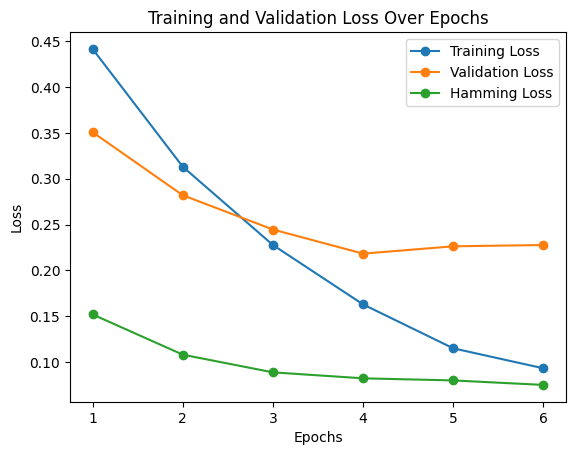

In [ ]:
import matplotlib.pyplot as plt
validation_loss = [0.3508, 0.2820, 0.2446, 0.2183, 0.2263, 0.2277]
train_loss = [0.4416, 0.3131, 0.2277, 0.1629, 0.1150, 0.0932]
hamming_loss =[0.1520,0.1081,0.0888,0.0823,0.0800,0.0751]
epochs = range(1, 7)

# Plotting the training and validation loss
plt.plot(epochs, train_loss, label='Training Loss', marker='o')
plt.plot(epochs, validation_loss, label='Validation Loss', marker='o')
plt.plot(epochs, hamming_loss, label='Hamming Loss', marker='o')


# Adding labels and title
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')

# Adding a legend
plt.legend()

# Display the plot
plt.show()

In [ ]:
# save_directory = "/content/drive/MyDrive/MLProject/balanced-no-changes"  # Change this to your preferred path
# model.save_pretrained(save_directory)
# tokenizer.save_pretrained(save_directory)

('/content/drive/MyDrive/MLProject/balanced-no-changes/tokenizer_config.json',
 '/content/drive/MyDrive/MLProject/balanced-no-changes/special_tokens_map.json',
 '/content/drive/MyDrive/MLProject/balanced-no-changes/vocab.json',
 '/content/drive/MyDrive/MLProject/balanced-no-changes/merges.txt',
 '/content/drive/MyDrive/MLProject/balanced-no-changes/added_tokens.json')

In [ ]:
# import shutil

# # Define the source folder path (local workspace) and destination folder path (Google Drive)
# source_folder = '/content/checkpoints/checkpoint_epoch_5.pt'
# destination_folder = '/content/drive/My Drive/checkpoints.pt'

# # Use shutil.move to move the folder
# shutil.move(source_folder, destination_folder)

'/content/drive/My Drive/checkpoints.pt'

In [ ]:
import shutil

# Define the source folder path (local workspace) and destination folder path (Google Drive)
source_folder = '/content/checkpoints/checkpoint_epoch_7.pt'
destination_folder = '/content/drive/My Drive/checkpoints_7_2.pt'

# Use shutil.move to move the folder
shutil.move(source_folder, destination_folder)

'/content/drive/My Drive/checkpoints_7_2.pt'

In [ ]:
# Set the model to evaluation mode
model.eval()

# Initialize variables to store results
test_loss = 0
test_predictions = []
test_true_labels = []

# Loss function
loss_fn = BCEWithLogitsLoss()

# No gradient is needed for evaluation
with torch.no_grad():
    for batch in test_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        # Forward pass
        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        test_loss += loss.item()

        # Store predictions and true labels
        test_predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        test_true_labels.append(labels.cpu().numpy())

# Calculate average loss
average_test_loss = test_loss / len(test_loader)
print(f"Average Test Loss: {average_test_loss:.4f}")

# Flatten the outputs
test_predictions = np.vstack(test_predictions)
test_true_labels = np.vstack(test_true_labels)

# Convert probabilities to binary predictions
threshold = 0.5
test_predictions[test_predictions >= threshold] = 1
test_predictions[test_predictions < threshold] = 0

# Calculate metrics
f1 = f1_score(true_labels, predictions, average='micro')
precision = precision_score(true_labels, predictions, average='micro')
recall = recall_score(true_labels, predictions, average='micro')
f1_mac = f1_score(true_labels, predictions, average='macro')
precision_mac = precision_score(true_labels, predictions, average='macro')
recall_mac = recall_score(true_labels, predictions, average='macro')
f1_w = f1_score(true_labels, predictions, average='weighted')
precision_w = precision_score(true_labels, predictions, average='weighted')
recall_w = recall_score(true_labels, predictions, average='weighted')
hamming = hamming_loss(true_labels, predictions)
ema_score = exact_match_accuracy(true_labels, predictions)
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print("-"*30)
print(f"Hamming Loss: {hamming:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print("-"*30)
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")


Average Test Loss: 0.2256
F1 Score: 0.8189
Precision: 0.8418
Recall: 0.7972
------------------------------
Hamming Loss: 0.0613
F1 Score Macro: 0.8086
Precision Macro: 0.8614
Recall Macro: 0.7740
------------------------------
F1 Score W: 0.8225
Precision W: 0.8602
Recall W: 0.7972
Exact Match Accuracy: 0.6635


### balanced 2

In [ ]:
# Set the model to evaluation mode
model.eval()

# Initialize variables to store results
test_loss = 0
test_predictions = []
test_true_labels = []

# Loss function
loss_fn = BCEWithLogitsLoss()

# No gradient is needed for evaluation
with torch.no_grad():
    for batch in test_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        # Forward pass
        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        test_loss += loss.item()

        # Store predictions and true labels
        test_predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        test_true_labels.append(labels.cpu().numpy())

# Calculate average loss
average_test_loss = test_loss / len(test_loader)
print(f"Average Test Loss: {average_test_loss:.4f}")

# Flatten the outputs
test_predictions = np.vstack(test_predictions)
test_true_labels = np.vstack(test_true_labels)

# Convert probabilities to binary predictions
threshold = 0.5
test_predictions[test_predictions >= threshold] = 1
test_predictions[test_predictions < threshold] = 0

# Calculate metrics
f1 = f1_score(true_labels, predictions, average='micro')
precision = precision_score(true_labels, predictions, average='micro')
recall = recall_score(true_labels, predictions, average='micro')
f1_mac = f1_score(true_labels, predictions, average='macro')
precision_mac = precision_score(true_labels, predictions, average='macro')
recall_mac = recall_score(true_labels, predictions, average='macro')
f1_w = f1_score(true_labels, predictions, average='weighted')
precision_w = precision_score(true_labels, predictions, average='weighted')
recall_w = recall_score(true_labels, predictions, average='weighted')
hamming = hamming_loss(true_labels, predictions)
ema_score, genre_score, mood_score = exact_match_accuracy(true_labels, predictions)
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print("-"*30)
print(f"Hamming Loss: {hamming:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print("-"*30)
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")
print(f"Exact Match Accuracy genre: {genre_score:.4f}")
print(f"Exact Match Accuracy mood: {mood_score:.4f}")


Average Test Loss: 0.2055
F1 Score: 0.8318
Precision: 0.8541
Recall: 0.8107
------------------------------
Hamming Loss: 0.0664
F1 Score Macro: 0.8365
Precision Macro: 0.8637
Recall Macro: 0.8164
------------------------------
F1 Score W: 0.8308
Precision W: 0.8599
Recall W: 0.8107
Exact Match Accuracy: 0.5741
Exact Match Accuracy genre: 0.6821
Exact Match Accuracy mood: 0.7994


#balnced 3 chk 4 - The final model we are using.
Its performance on test set

In [ ]:
# Set the model to evaluation mode
model.eval()
from torch.nn import BCEWithLogitsLoss
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np

# Initialize variables to store results
test_loss = 0
test_predictions = []
test_true_labels = []

# Loss function
loss_fn = BCEWithLogitsLoss()

# No gradient is needed for evaluation
with torch.no_grad():
    for batch in test_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        # Forward pass
        outputs = model(input_ids, attention_mask=attention_mask)
        loss = loss_fn(outputs.logits, labels)
        test_loss += loss.item()

        # Store predictions and true labels
        test_predictions.append(torch.sigmoid(outputs.logits).cpu().numpy())
        test_true_labels.append(labels.cpu().numpy())

# Calculate average loss
average_test_loss = test_loss / len(test_loader)
print(f"Average Test Loss: {average_test_loss:.4f}")

# Flatten the outputs
test_predictions = np.vstack(test_predictions)
test_true_labels = np.vstack(test_true_labels)

# Convert probabilities to binary predictions
threshold = 0.5
test_predictions[test_predictions >= threshold] = 1
test_predictions[test_predictions < threshold] = 0

# Calculate metrics
f1 = f1_score(test_true_labels, test_predictions, average='micro')
precision = precision_score(test_true_labels, test_predictions, average='micro')
recall = recall_score(test_true_labels, test_predictions, average='micro')
f1_mac = f1_score(test_true_labels, test_predictions, average='macro')
precision_mac = precision_score(test_true_labels, test_predictions, average='macro')
recall_mac = recall_score(test_true_labels, test_predictions, average='macro')
f1_w = f1_score(test_true_labels, test_predictions, average='weighted')
precision_w = precision_score(test_true_labels, test_predictions, average='weighted')
recall_w = recall_score(test_true_labels, test_predictions, average='weighted')
hamming = hamming_loss(test_true_labels, test_predictions)
ema_score, genre_score, mood_score = exact_match_accuracy(test_true_labels, test_predictions)
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print("-"*30)
print(f"Hamming Loss: {hamming:.4f}")
print(f"F1 Score Macro: {f1_mac:.4f}")
print(f"Precision Macro: {precision_mac:.4f}")
print(f"Recall Macro: {recall_mac:.4f}")
print("-"*30)
print(f"F1 Score W: {f1_w:.4f}")
print(f"Precision W: {precision_w:.4f}")
print(f"Recall W: {recall_w:.4f}")
print(f"Exact Match Accuracy: {ema_score:.4f}")
print(f"Exact Match Accuracy genre: {genre_score:.4f}")
print(f"Exact Match Accuracy mood: {mood_score:.4f}")


Average Test Loss: 0.2183
F1 Score: 0.7941
Precision: 0.8480
Recall: 0.7467
------------------------------
Hamming Loss: 0.0776
F1 Score Macro: 0.7710
Precision Macro: 0.8456
Recall Macro: 0.7252
------------------------------
F1 Score W: 0.7859
Precision W: 0.8455
Recall W: 0.7467
Exact Match Accuracy: 0.5025
Exact Match Accuracy genre: 0.6139
Exact Match Accuracy mood: 0.7995


### inference from lyrics

In [ ]:
lyr='''[Verse 1: Danny O'Donoghue & will.i.am]
Yeah, you can be the greatest, you can be the best
You can be the King Kong bangin' on your chest
You can beat the world, you can beat the war
You can talk to God, go bangin' on his door
You can throw your hands up, you can beat the clock (Yeah)
You can move a mountain, you can break rocks
You can be a master, don't wait for luck
Dedicate yourself and you gon' find yourself

[Chorus: Danny O'Donoghue & will.i.am]
Standin' in the Hall of Fame (Yeah)
And the world's gonna know your name (Yeah)
'Cause you burn with the brightest flame (Yeah)
And the world's gonna know your name (Yeah)
And you'll be on the walls of the Hall of Fame

[Verse 2: Danny O'Donoghue & will.i.am]
You can go the distance, you can run the mile
You can walk straight through hell with a smile
You can be the hero, you can get the gold
Breakin' all the records they thought never could be broke, yeah
Do it for your people, do it for your pride
How are you ever gonna know if you never even try?
Do it for your country, do it for your name
'Cause there's gon' be a day, when you're

[Chorus: Danny O'Donoghue & will.i.am]
Standin' in the Hall of Fame (Yeah)
And the world's gonna know your name (Yeah)
'Cause you burn with the brightest flame (Yeah)
And the world's gonna know your name (Yeah)
And you'll be on the walls of the Hall of Fame

[Post-Chorus: will.i.am]
Be a champion
Be a champion
Be a champion
Be a champion
And you'll be on the walls of the Hall of Fame

[Bridge: Danny O'Donoghue]
Be students, be teachers
Be politicians, be preachers
Yeah
Be believers, be leaders
Be astronauts, be champions
Be truth-seekers
Be students, be teachers
Be politicians, be preachers
Yeah
Be believers, be leaders
Be astronauts, be champions

[Chorus: Danny O'Donoghue & will.i.am]
Standin' in the Hall of Fame (Yeah)
And the world's gonna know your name (Yeah)
'Cause you burn with the brightest flame (Yeah)
And the world's gonna know your name (Yeah)
And you'll be on the walls of the Hall of Fame

[Outro: Danny O'Donoghue & will.i.am]
You can be the greatest, you can be the best
(Be a champion)
You can be the King Kong bangin' on your chest
(You can be a champion)
You can beat the world, you can beat the war
(Be a champion)
You can talk to God, go bangin' on his door
(You can be a champion)
You can throw your hands up, you can beat the clock
(You can be a champion)
You can move a mountain, you can break rocks
(You can be a champion)
You can be a master, don't wait for luck
(You can be a champion)
Dedicate yourself and you gon' find yourself
(You can be a champion)
Standing in the Hall of Fame…'''

In [ ]:
del model

In [ ]:
import torch
from transformers import  RobertaForSequenceClassification, RobertaConfig, RobertaTokenizer

tokenizer = RobertaTokenizer.from_pretrained('roberta-large')
model_path = '/content/drive/MyDrive/MLProject/weights/roberta final/checkpoints_7_2.pt'  # Replace with the path to your .pt file
config = RobertaConfig.from_pretrained('roberta-large')
config.num_labels = 12
model = RobertaForSequenceClassification(config)
checkpoint = torch.load(model_path, map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['model_state_dict'])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 1024, padding_idx=1)
      (position_embeddings): Embedding(514, 1024, padding_idx=1)
      (token_type_embeddings): Embedding(1, 1024)
      (LayerNorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-23): 24 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSelfAttention(
              (query): Linear(in_features=1024, out_features=1024, bias=True)
              (key): Linear(in_features=1024, out_features=1024, bias=True)
              (value): Linear(in_features=1024, out_features=1024, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=1024, out_features=1024, bias=True)
 

In [ ]:
# inputs = tokenizer(lyr, return_tensors='pt', max_length=512, truncation=True, padding=True)
# input_ids = inputs["input_ids"].to(device)
# attention_mask = inputs["attention_mask"].to(device)

# # Predict
# with torch.no_grad():
#     outputs = model(input_ids, attention_mask=attention_mask)
#     logits = outputs.logits
#     probabilities = torch.sigmoid(logits).cpu().numpy()

# predicted_labels = [mlb.classes_[i] for i, value in enumerate(probabilities[0]) if value > 0.5]

# print("Predicted Labels:", predicted_labels)

Predicted Labels: ['hiphop', 'motivating/inspirational/uplifting/confidence/nostalgia']


In [ ]:
def get_roberta_embeddings(text, model, tokenizer):
    inputs = tokenizer(text, return_tensors='pt', max_length=512, truncation=True, padding=True)
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask, output_hidden_states=True)

    last_hidden_state_embd = outputs.hidden_states[-1][:, 0, :]
    second_last = outputs.hidden_states[-2][:, 0, :]
    # print (len(outputs.hidden_states))
    return last_hidden_state_embd,second_last

In [ ]:
df['text_embd_1']=''
df['text_embd_2']=''
c=0
for idx,row in df.iterrows():
  last,secl = get_roberta_embeddings(row['lyrics'], model, tokenizer)
  df.at[idx, 'text_embd_1']=last.cpu().numpy()
  df.at[idx, 'text_embd_2']=secl.cpu().numpy()
  c+=1
  if c%50==0:
    print (f"Done {c}")

Done 50
Done 100
Done 150
Done 200
Done 250
Done 300
Done 350
Done 400
Done 450
Done 500
Done 550
Done 600
Done 650
Done 700
Done 750
Done 800
Done 850
Done 900
Done 950
Done 1000
Done 1050
Done 1100
Done 1150
Done 1200
Done 1250
Done 1300
Done 1350
Done 1400
Done 1450
Done 1500
Done 1550
Done 1600
Done 1650
Done 1700
Done 1750
Done 1800
Done 1850
Done 1900
Done 1950
Done 2000


In [ ]:
df.columns

Index(['title', 'artist', 'genius_id', 'video_id', 'genres_self',
       'genres_genius', 'recording_ids', 'selected_mbid', 'mood', 'genres_mb',
       'genres_ab', 'lyrics', 'final_genres', 'final_mood', 'merged_labels',
       'labels', 'text_embd_1', 'text_embd_2'],
      dtype='object')

In [ ]:
final_df = df[['video_id', 'genres_self','final_genres', 'final_mood', 'merged_labels', 'text_embd_1', 'text_embd_2']]

In [ ]:
final_df.to_csv('/content/drive/MyDrive/MLProject/lyrics-embeddings-final.csv', index=False)

In [ ]:
final_df.to_pickle('/content/drive/MyDrive/MLProject/lyrics-embeddings-final.pkl')

### glove

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk.corpus import stopwords
import string
import re

stop_words = set(stopwords.words('english'))

def preprocess_lyrics(lyrics):
    lyrics = lyrics.lower()
    lyrics = re.sub(f'[{re.escape(string.punctuation)}]', '', lyrics)
    words = lyrics.split()
    filtered_words = [word for word in words if word not in stop_words]
    return ' '.join(filtered_words)

df['processed_lyrics'] = df['lyrics'].apply(preprocess_lyrics)

In [ ]:
import numpy as np
import gensim.downloader as api

glove_model = api.load("glove-wiki-gigaword-100")

def get_glove_embedding(text, glove_model):
    words = text.split()
    word_embeddings = [glove_model[word] for word in words if word in glove_model]
    if len(word_embeddings) == 0:
        return np.zeros(glove_model.vector_size)
    return np.mean(word_embeddings, axis=0)


df['glove_features'] = df['processed_lyrics'].apply(lambda x: get_glove_embedding(x, glove_model))

[==================================================] 100.0% 128.1/128.1MB downloaded


In [ ]:
train_df['processed_lyrics'] = train_df['lyrics'].apply(preprocess_lyrics)
train_df['glove_features'] = train_df['processed_lyrics'].apply(lambda x: get_glove_embedding(x, glove_model))
test_df['processed_lyrics'] = test_df['lyrics'].apply(preprocess_lyrics)
test_df['glove_features'] = test_df['processed_lyrics'].apply(lambda x: get_glove_embedding(x, glove_model))
val_df['processed_lyrics'] = val_df['lyrics'].apply(preprocess_lyrics)
val_df['glove_features'] = val_df['processed_lyrics'].apply(lambda x: get_glove_embedding(x, glove_model))

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class GloVeClassifier(nn.Module):
    def __init__(self, embedding_dim, num_labels):
        super(GloVeClassifier, self).__init__()
        self.dense = nn.Linear(embedding_dim, 1024)
        self.dropout = nn.Dropout(0.1)
        self.out_proj = nn.Linear(1024, num_labels)

    def forward(self, x):
        x = F.relu(self.dense(x))
        x = self.dropout(x)
        x = self.out_proj(x)
        return x

embedding_dim = glove_model.vector_size  # This should match the GloVe embedding size
num_labels = len(mlb.classes_)
glove_classifier = GloVeClassifier(embedding_dim, num_labels)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
glove_classifier.to(device)

GloVeClassifier(
  (dense): Linear(in_features=100, out_features=1024, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (out_proj): Linear(in_features=1024, out_features=12, bias=True)
)

In [ ]:
from torch.utils.data import DataLoader,Dataset
class GloVeDataset(Dataset):
    def __init__(self, dataframe):
        self.labels = list(dataframe['labels'])
        self.features = list(dataframe['glove_features'])

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return {
            'features': torch.tensor(self.features[idx], dtype=torch.float),
            'labels': torch.tensor(self.labels[idx], dtype=torch.float)
        }

# Prepare datasets and dataloaders
glove_train_dataset = GloVeDataset(train_df)
glove_val_dataset = GloVeDataset(val_df)
glove_test_dataset = GloVeDataset(test_df)

train_loader = DataLoader(glove_train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(glove_val_dataset, batch_size=32)
test_loader = DataLoader(glove_test_dataset, batch_size=32)

### balnced data with genre

In [ ]:
from torch.optim import AdamW
from tqdm.auto import tqdm
from torch.nn import BCEWithLogitsLoss
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np


optimizer = AdamW(glove_classifier.parameters(), lr=1e-4)
loss_fn = BCEWithLogitsLoss()

# Training Loop
epochs = 500 # Same as RoBERTa for fair comparison
train_loss_l=[]
val_loss_l=[]
f1=[]
prec=[]
recall=[]
ham=[]
f1_mac=[]
prec_mac=[]
recall_mac=[]
f1_w=[]
recall_w=[]
prec_w=[]
ema_s=[]

for epoch in range(epochs):
    glove_classifier.train()
    total_loss = 0

    for batch in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}"):
        optimizer.zero_grad()
        features = batch['features'].to(device)
        labels = batch['labels'].to(device)

        outputs = glove_classifier(features)
        loss = loss_fn(outputs, labels)
        total_loss += loss.item()
        loss.backward()
        optimizer.step()

    avg_train_loss = total_loss / len(train_loader)
    train_loss_l.append(avg_train_loss)

    glove_classifier.eval()
    val_loss = 0
    val_predictions = []
    val_true_labels = []

    with torch.no_grad():
        for batch in val_loader:
            features = batch['features'].to(device)
            labels = batch['labels'].to(device)
            outputs = glove_classifier(features)
            loss = loss_fn(outputs, labels)
            val_loss += loss.item()
            val_predictions.append(torch.sigmoid(outputs).cpu().numpy())
            val_true_labels.append(labels.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader)
    val_loss_l.append(avg_val_loss)

    val_predictions = np.vstack(val_predictions)
    val_true_labels = np.vstack(val_true_labels)

    threshold = 0.5
    val_predictions[val_predictions >= threshold] = 1
    val_predictions[val_predictions < threshold] = 0

    val_f1 = f1_score(val_true_labels, val_predictions, average='micro')
    val_precision = precision_score(val_true_labels, val_predictions, average='micro')
    val_recall = recall_score(val_true_labels, val_predictions, average='micro')
    val_f1_mac = f1_score(val_true_labels, val_predictions, average='macro')
    val_precision_mac = precision_score(val_true_labels, val_predictions, average='macro')
    val_recall_mac = recall_score(val_true_labels, val_predictions, average='macro')
    val_f1_w = f1_score(val_true_labels, val_predictions, average='weighted')
    val_precision_w = precision_score(val_true_labels, val_predictions, average='weighted')
    val_recall_w = recall_score(val_true_labels, val_predictions, average='weighted')
    val_hamming = hamming_loss(val_true_labels, val_predictions)
    ema_score = exact_match_accuracy(val_true_labels, val_predictions)

    f1.append(val_f1)
    prec.append(val_precision)
    recall.append(val_recall)
    f1_mac.append(val_f1_mac)
    prec_mac.append(val_precision_mac)
    recall_mac.append(val_recall_mac)
    f1_w.append(val_f1_w)
    prec_w.append(val_precision_w)
    recall_w.append(val_recall_w)
    ham.append(val_hamming)
    ema_s.append(ema_score)

Training Epoch 1:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 2:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 3:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 4:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 5:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 6:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 7:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 8:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 9:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 10:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 11:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 12:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 13:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 14:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 15:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 16:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 17:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 18:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 19:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 20:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 21:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 22:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 23:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 24:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 25:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 26:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 27:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 28:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 29:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 30:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 31:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 32:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 33:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 34:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 35:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 36:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 37:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 38:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 39:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 40:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 41:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 42:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 43:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 44:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 45:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 46:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 47:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 48:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 49:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 50:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 51:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 52:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 53:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 54:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 55:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 56:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 57:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 58:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 59:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 60:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 61:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 62:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 63:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 64:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 65:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 66:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 67:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 68:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 69:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 70:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 71:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 72:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 73:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 74:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 75:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 76:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 77:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 78:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 79:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 80:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 81:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 82:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 83:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 84:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 85:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 86:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 87:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 88:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 89:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 90:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 91:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 92:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 93:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 94:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 95:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 96:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 97:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 98:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 99:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 100:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 101:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 102:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 103:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 104:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 105:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 106:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 107:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 108:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 109:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 110:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 111:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 112:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 113:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 114:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 115:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 116:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 117:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 118:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 119:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 120:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 121:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 122:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 123:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 124:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 125:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 126:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 127:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 128:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 129:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 130:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 131:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 132:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 133:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 134:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 135:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 136:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 137:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 138:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 139:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 140:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 141:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 142:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 143:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 144:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 145:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 146:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 147:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 148:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 149:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 150:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 151:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 152:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 153:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 154:   0%|          | 0/39 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 155:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 156:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 157:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 158:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 159:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 160:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 161:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 162:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 163:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 164:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 165:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 166:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 167:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 168:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 169:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 170:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 171:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 172:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 173:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 174:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 175:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 176:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 177:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 178:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 179:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 180:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 181:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 182:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 183:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 184:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 185:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 186:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 187:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 188:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 189:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 190:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 191:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 192:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 193:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 194:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 195:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 196:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 197:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 198:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 199:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 200:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 201:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 202:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 203:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 204:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 205:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 206:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 207:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 208:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 209:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 210:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 211:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 212:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 213:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 214:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 215:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 216:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 217:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 218:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 219:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 220:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 221:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 222:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 223:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 224:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 225:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 226:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 227:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 228:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 229:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 230:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 231:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 232:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 233:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 234:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 235:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 236:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 237:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 238:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 239:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 240:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 241:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 242:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 243:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 244:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 245:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 246:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 247:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 248:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 249:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 250:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 251:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 252:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 253:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 254:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 255:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 256:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 257:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 258:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 259:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 260:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 261:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 262:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 263:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 264:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 265:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 266:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 267:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 268:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 269:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 270:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 271:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 272:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 273:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 274:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 275:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 276:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 277:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 278:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 279:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 280:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 281:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 282:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 283:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 284:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 285:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 286:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 287:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 288:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 289:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 290:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 291:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 292:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 293:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 294:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 295:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 296:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 297:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 298:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 299:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 300:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 301:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 302:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 303:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 304:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 305:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 306:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 307:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 308:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 309:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 310:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 311:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 312:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 313:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 314:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 315:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 316:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 317:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 318:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 319:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 320:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 321:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 322:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 323:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 324:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 325:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 326:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 327:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 328:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 329:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 330:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 331:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 332:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 333:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 334:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 335:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 336:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 337:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 338:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 339:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 340:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 341:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 342:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 343:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 344:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 345:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 346:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 347:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 348:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 349:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 350:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 351:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 352:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 353:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 354:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 355:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 356:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 357:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 358:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 359:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 360:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 361:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 362:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 363:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 364:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 365:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 366:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 367:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 368:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 369:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 370:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 371:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 372:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 373:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 374:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 375:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 376:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 377:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 378:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 379:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 380:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 381:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 382:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 383:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 384:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 385:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 386:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 387:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 388:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 389:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 390:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 391:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 392:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 393:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 394:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 395:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 396:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 397:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 398:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 399:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 400:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 401:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 402:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 403:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 404:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 405:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 406:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 407:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 408:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 409:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 410:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 411:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 412:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 413:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 414:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 415:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 416:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 417:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 418:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 419:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 420:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 421:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 422:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 423:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 424:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 425:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 426:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 427:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 428:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 429:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 430:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 431:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 432:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 433:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 434:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 435:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 436:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 437:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 438:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 439:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 440:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 441:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 442:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 443:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 444:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 445:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 446:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 447:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 448:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 449:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 450:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 451:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 452:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 453:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 454:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 455:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 456:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 457:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 458:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 459:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 460:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 461:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 462:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 463:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 464:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 465:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 466:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 467:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 468:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 469:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 470:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 471:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 472:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 473:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 474:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 475:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 476:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 477:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 478:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 479:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 480:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 481:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 482:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 483:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 484:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 485:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 486:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 487:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 488:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 489:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 490:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 491:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 492:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 493:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 494:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 495:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 496:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 497:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 498:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 499:   0%|          | 0/39 [00:00<?, ?it/s]

Training Epoch 500:   0%|          | 0/39 [00:00<?, ?it/s]

### balanced 2 data with both

In [ ]:
from torch.optim import AdamW
from tqdm.auto import tqdm
from torch.nn import BCEWithLogitsLoss
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss
import numpy as np


optimizer = AdamW(glove_classifier.parameters(), lr=1e-4)
loss_fn = BCEWithLogitsLoss()

# Training Loop
epochs = 300 # Same as RoBERTa for fair comparison
train_loss_l=[]
val_loss_l=[]
f1=[]
prec=[]
recall=[]
ham=[]
f1_mac=[]
prec_mac=[]
recall_mac=[]
f1_w=[]
recall_w=[]
prec_w=[]
ema_s=[]
ema_g = []
ema_m= []

for epoch in range(epochs):
    glove_classifier.train()
    total_loss = 0

    for batch in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}"):
        optimizer.zero_grad()
        features = batch['features'].to(device)
        labels = batch['labels'].to(device)

        outputs = glove_classifier(features)
        loss = loss_fn(outputs, labels)
        total_loss += loss.item()
        loss.backward()
        optimizer.step()

    avg_train_loss = total_loss / len(train_loader)
    train_loss_l.append(avg_train_loss)

    glove_classifier.eval()
    val_loss = 0
    val_predictions = []
    val_true_labels = []

    with torch.no_grad():
        for batch in val_loader:
            features = batch['features'].to(device)
            labels = batch['labels'].to(device)
            outputs = glove_classifier(features)
            loss = loss_fn(outputs, labels)
            val_loss += loss.item()
            val_predictions.append(torch.sigmoid(outputs).cpu().numpy())
            val_true_labels.append(labels.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader)
    val_loss_l.append(avg_val_loss)

    val_predictions = np.vstack(val_predictions)
    val_true_labels = np.vstack(val_true_labels)

    threshold = 0.5
    val_predictions[val_predictions >= threshold] = 1
    val_predictions[val_predictions < threshold] = 0

    val_f1 = f1_score(val_true_labels, val_predictions, average='micro')
    val_precision = precision_score(val_true_labels, val_predictions, average='micro')
    val_recall = recall_score(val_true_labels, val_predictions, average='micro')
    val_f1_mac = f1_score(val_true_labels, val_predictions, average='macro')
    val_precision_mac = precision_score(val_true_labels, val_predictions, average='macro')
    val_recall_mac = recall_score(val_true_labels, val_predictions, average='macro')
    val_f1_w = f1_score(val_true_labels, val_predictions, average='weighted')
    val_precision_w = precision_score(val_true_labels, val_predictions, average='weighted')
    val_recall_w = recall_score(val_true_labels, val_predictions, average='weighted')
    val_hamming = hamming_loss(val_true_labels, val_predictions)
    ema_score,genre_score,mood_score = exact_match_accuracy(val_true_labels, val_predictions)

    f1.append(val_f1)
    prec.append(val_precision)
    recall.append(val_recall)
    f1_mac.append(val_f1_mac)
    prec_mac.append(val_precision_mac)
    recall_mac.append(val_recall_mac)
    f1_w.append(val_f1_w)
    prec_w.append(val_precision_w)
    recall_w.append(val_recall_w)
    ham.append(val_hamming)
    ema_s.append(ema_score)
    ema_g.append(genre_score)
    ema_m.append(mood_score)

Training Epoch 1:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 2:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 3:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 4:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 5:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 6:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 7:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 8:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 9:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 10:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 11:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 12:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 13:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 14:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 15:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 16:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 17:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 18:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 19:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 20:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 21:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 22:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 23:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 24:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 25:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 26:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 27:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 28:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 29:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 30:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 31:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 32:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 33:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 34:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 35:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 36:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 37:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 38:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 39:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 40:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 41:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 42:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 43:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 44:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 45:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 46:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 47:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 48:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 49:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 50:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 51:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 52:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 53:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 54:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 55:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 56:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 57:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 58:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 59:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 60:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 61:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 62:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 63:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 64:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 65:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 66:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 67:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 68:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 69:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 70:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 71:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 72:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 73:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 74:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 75:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 76:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 77:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 78:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 79:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 80:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 81:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 82:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 83:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 84:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 85:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 86:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 87:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 88:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 89:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 90:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 91:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 92:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 93:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 94:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 95:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 96:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 97:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 98:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Epoch 99:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 100:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 101:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 102:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 103:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 104:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 105:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 106:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 107:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 108:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 109:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 110:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 111:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 112:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 113:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 114:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 115:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 116:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 117:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 118:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 119:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 120:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 121:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 122:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 123:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 124:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 125:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 126:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 127:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 128:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 129:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 130:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 131:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 132:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 133:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 134:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 135:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 136:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 137:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 138:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 139:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 140:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 141:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 142:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 143:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 144:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 145:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 146:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 147:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 148:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 149:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 150:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 151:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 152:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 153:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 154:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 155:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 156:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 157:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 158:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 159:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 160:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 161:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 162:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 163:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 164:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 165:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 166:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 167:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 168:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 169:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 170:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 171:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 172:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 173:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 174:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 175:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 176:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 177:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 178:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 179:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 180:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 181:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 182:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 183:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 184:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 185:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 186:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 187:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 188:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 189:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 190:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 191:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 192:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 193:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 194:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 195:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 196:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 197:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 198:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 199:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 200:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 201:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 202:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 203:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 204:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 205:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 206:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 207:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 208:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 209:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 210:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 211:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 212:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 213:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 214:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 215:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 216:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 217:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 218:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 219:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 220:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 221:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 222:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 223:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 224:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 225:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 226:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 227:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 228:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 229:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 230:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 231:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 232:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 233:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 234:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 235:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 236:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 237:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 238:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 239:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 240:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 241:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 242:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 243:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 244:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 245:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 246:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 247:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 248:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 249:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 250:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 251:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 252:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 253:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 254:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 255:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 256:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 257:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 258:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 259:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 260:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 261:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 262:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 263:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 264:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 265:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 266:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 267:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 268:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 269:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 270:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 271:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 272:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 273:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 274:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 275:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 276:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 277:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 278:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 279:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 280:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 281:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 282:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 283:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 284:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 285:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 286:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 287:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 288:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 289:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 290:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 291:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 292:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 293:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 294:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 295:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 296:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 297:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 298:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 299:   0%|          | 0/41 [00:00<?, ?it/s]

Training Epoch 300:   0%|          | 0/41 [00:00<?, ?it/s]

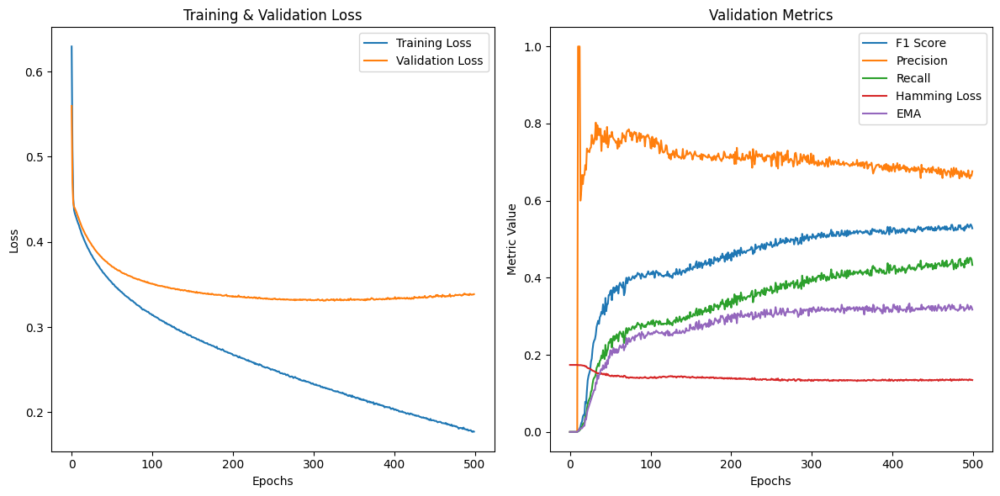

In [ ]:
import matplotlib.pyplot as plt

# Plotting Training and Validation Loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_loss_l, label='Training Loss')
plt.plot(val_loss_l, label='Validation Loss')
plt.title('Training & Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting F1 Score, Precision, Recall, and Hamming Loss
plt.subplot(1, 2, 2)
plt.plot(f1, label='F1 Score')
plt.plot(prec, label='Precision')
plt.plot(recall, label='Recall')
plt.plot(ham, label='Hamming Loss')
plt.plot(ema_s, label='EMA')
plt.title('Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metric Value')
plt.legend()

plt.tight_layout()
plt.show()


### balanced data 2 with both

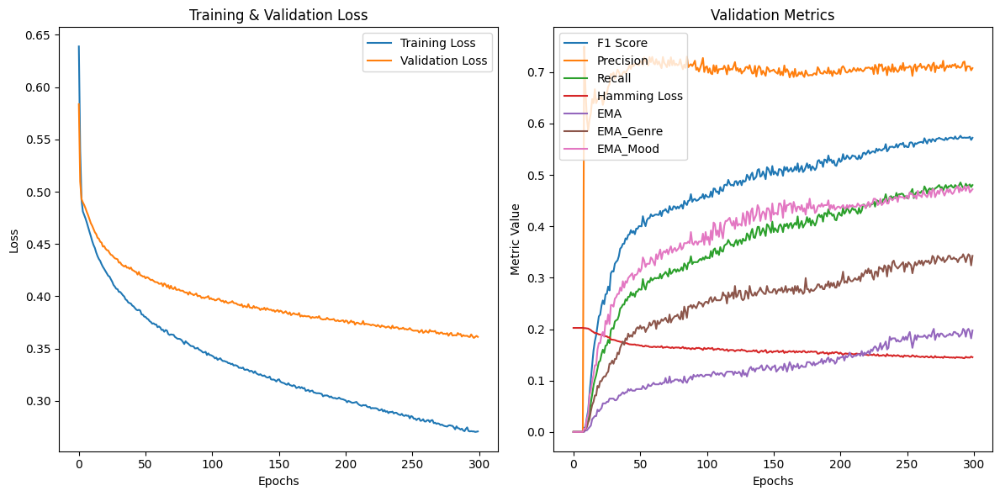

In [ ]:
import matplotlib.pyplot as plt

# Plotting Training and Validation Loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_loss_l, label='Training Loss')
plt.plot(val_loss_l, label='Validation Loss')
plt.title('Training & Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting F1 Score, Precision, Recall, and Hamming Loss
plt.subplot(1, 2, 2)
plt.plot(f1, label='F1 Score')
plt.plot(prec, label='Precision')
plt.plot(recall, label='Recall')
plt.plot(ham, label='Hamming Loss')
plt.plot(ema_s, label='EMA')
plt.plot(ema_g, label='EMA_Genre')
plt.plot(ema_m,label='EMA_Mood')
plt.title('Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metric Value')
plt.legend()

plt.tight_layout()
plt.show()
